<a href="https://colab.research.google.com/github/GMdSilva/10.5281-zenodo-8235542_response/blob/main/af2_traj_local_0_0_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Prediction of protein conformational distributions with subsampled AlphaFold2 in the Cloud**


This Jupyter notebook presents an innovative approach for predicting the relative populations of protein conformations using AlphaFold 2 (AF2). Here, we are going to set up a protocol to subsample multiple sequence alignments and generate ensembles of protein conformations and test AF2's capacity to predict sequence-induced differences in the conformational distributions of the Abl1 tyrosine kinase. This notebook is a supplementary material of the paper "***High-throughput prediction of protein conformational distributions with subsampled AlphaFold2***" ([link here](https://doi.org/10.1038/s41467-024-46715-9)) and we encourage you to read it before using this pipeline.

Scripts used to assemble the MSAs and run AlphaFold2 with different subsampling conditions have been deposited in the GitHub repository https://github.com/GMdSilva/gms_natcomms_1705932980_data

The main goal of this notebook is to demonstrate how AlphaFold 2 can directly predict the relative populations of different protein conformations by subsampling multiple sequence alignments

---

 **This notebook is NOT a standard protocol to predict the relative populations of different protein conformations!** It is just simple pipeline illustrating each step of a protocol.

---
**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/GMdSilva/gms_natcomms_1705932980_data/issues

**Acknowledgments**

- We would like to thank the AlphaFold team for developing an excellent model and open sourcing the software.
- We would like to thank [Making it rain](https://github.com/pablo-arantes/making-it-rain) team, **Pablo R. Arantes** ([@pablitoarantes](https://twitter.com/pablitoarantes)), **Marcelo D. Polêto** ([@mdpoleto](https://twitter.com/mdpoleto)), **Conrado Pedebos** ([@ConradoPedebos](https://twitter.com/ConradoPedebos)) and **Rodrigo Ligabue-Braun** ([@ligabue_braun](https://twitter.com/ligabue_braun)), for their amazing work. The present notebook was strongly inspired on Making it rain idea.
- A work by **Gabriel Monteiro da Silva**, **Jennifer Y. Cui**, **David C. Dalgarno**, **George P. Lisi** and **Brenda M. Rubenstein**.

# Introduction

In terms of inputs, we wil need:
*  An amino acid sequence of your protein.

In this notebook, we will test the accuracy of different AF2 parameter combinations to predict the Abl1 kinase core structural ensemble. We chose the Abl1 kinase core for our test case due to this protein's extensively documented dynamics.

## Using Google Drive to store the data

Google Colab does not allow users to keep data on their computing nodes. However, we can use Google Drive to read, write, and store our files. Therefore, we suggest to you to:

1.  Copy the path of your created directory. We will use it below.

In [ ]:
#@title ### **Import Google Drive**
#@markdown Click in the "Run" buttom to make your Google Drive accessible.
from google.colab import drive

drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
#@title **Check if you correctly allocated GPU nodes**

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mon Apr  1 18:44:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
#@title **Install dependencies**
#@markdown It will take a few minutes, please wait. ;-)
# install dependencies
%%capture
import sys
import os
import subprocess

commands = [
    "wget https://raw.githubusercontent.com/YoshitakaMo/localcolabfold/main/install_colabbatch_linux.sh",
    "bash install_colabbatch_linux.sh",
    "pip install MDAnalysis",
    "pip install py3dmol",
    "pip install -U matplotlib"
]

for cmd in commands:
    subprocess.run(cmd, shell=True)

In [ ]:
#@title **Make predictions with given subsampling range**
import subprocess

jobname = test #@param
custom_msa_path = 'path_to_your_msa.a3m' #@param

#@markdown First subsampling range:
max_seq1 = "8" #@param ["1024", "512", "256", "128", "64", "32", "16", "8"]
extra_seq1 = "16" #@param ["1024", "512", "256", "128", "64", "32", "16", "8"]
#@markdown Second subsampling range:
max_seq2 = "64" #@param ["1024", "512", "256", "128", "64", "32", "16", "8"]
extra_seq2 = "128" #@param ["1024", "512", "256", "128", "64", "32", "16", "8"]
#@markdown Third subsampling range:
max_seq3 = "256" #@param ["1024", "512", "256", "128", "64", "32", "16", "8"]
extra_seq3 = "512" #@param ["1024", "512", "256", "128", "64", "32", "16", "8"]

#@markdown Define the number of seeds:
seeds = 2 #@param {type:"slider", min:1, max:100, step:1}
save_all = True # @param {type:"boolean"}

max_seq = [max_seq1, max_seq2, max_seq3]
extra_seq = [extra_seq1, extra_seq2, extra_seq3]

print("max_seq =", max_seq)
print("extra_seq =", extra_seq)

for max_seq_v, extra_seq_v in zip(max_seq, extra_seq):
  if save_all:
    command = f"colabfold_batch {custom_msa_path} {jobname}_preds_{max_seq_v}_{extra_seq_v}/ --use-dropout --num-seeds {seeds} --max-msa {max_seq_v}:{extra_seq_v} --save-all"
  else:
    command = f"colabfold_batch {custom_msa_path} {jobname}_preds_{max_seq_v}_{extra_seq_v}/ --use-dropout --num-seeds {seeds} --max-msa {max_seq_v}:{extra_seq_v}"

  print(f'Making prediction for {jobname} using max_seq: {max_seq_v} and extra_seq: {extra_seq_v} with {seeds} seeds...')

  process = subprocess.Popen(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True)

  # Read line by line as they are output
  while True:
    output = process.stdout.readline()
    if output == '' and process.poll() is not None:
        break
    if output:
        print(output.strip())
  rc = process.poll()


max_seq = ['8', '64', '256']
extra_seq = ['16', '128', '512']
Making prediction for abl12 using max_seq: 8 and extra_seq: 16 with 2 seeds...
2024-04-02 05:09:14,950 Running colabfold 1.5.5 (61df3b853140ca79dbdf64349824beb14364ebfd)
2024-04-02 05:09:15,633 Running on GPU
2024-04-02 05:09:16,843 Found 5 citations for tools or databases
2024-04-02 05:09:16,843 Query 1/1: abl12 (length 252)
2024-04-02 05:09:33,642 Setting max_seq=8, max_extra_seq=16
2024-04-02 05:10:49,302 alphafold2_ptm_model_1_seed_000 recycle=0 pLDDT=35.9 pTM=0.322
2024-04-02 05:10:55,869 alphafold2_ptm_model_1_seed_000 recycle=1 pLDDT=53.2 pTM=0.449 tol=12
2024-04-02 05:11:02,538 alphafold2_ptm_model_1_seed_000 recycle=2 pLDDT=73.8 pTM=0.751 tol=3.36
2024-04-02 05:11:09,451 alphafold2_ptm_model_1_seed_000 recycle=3 pLDDT=77.8 pTM=0.796 tol=1.11
2024-04-02 05:11:09,451 alphafold2_ptm_model_1_seed_000 took 54.2s (3 recycles)
2024-04-02 05:11:16,511 alphafold2_ptm_model_2_seed_000 recycle=0 pLDDT=35.4 pTM=0.281
2024-04-02

In [ ]:
#@title **Calculate RMSF of Predictions**

#@markdown Alignment range for RMSF calculations in MDAnalysis syntax:
rmsf_sel = "backbone" #@param {type:"string"}

import matplotlib.pyplot as plt
from MDAnalysis.analysis import rms, align
import os
import glob
import re
import MDAnalysis as mda
from MDAnalysis.analysis import pca, align
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.cm as cm
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score


class loadPredictions:
    def __init__(self, trajectory_files, topology_file):
        """
        Initialize the LoadTrajectory class with a list of trajectory files and a single topology file.

        :param trajectory_files: List of paths to trajectory files (.pdb)
        :param topology_file: Path to the topology file (.pdb)
        """
        self.trajectory_files = trajectory_files
        self.topology_file = topology_file
        self.universe = None

    def load(self):
        """
        Load the trajectories and the topology file into an MDAnalysis Universe.
        """
        try:
            self.universe = mda.Universe(self.topology_file, self.trajectory_files, dt=1)
        except Exception as e:
            print(f"An error occurred while loading the files: {e}")

    def get_universe(self):
        """
        Return the MDAnalysis Universe object.
        """
        if self.universe is not None:
            return self.universe
        else:
            print("Universe not loaded. Call the 'load' method first.")
            return None


def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    """
    Helper function for natural sorting (human sorting).
    """
    return [atoi(c) for c in re.split(r'(\d+)', text)]

def sorted_natural_glob(pattern, sort=False):
    """
    Perform a glob search and return a list of file paths.
    Sort the list naturally by file name if sort is True.

    :param pattern: Glob pattern to search for.
    :param sort: Boolean indicating whether to sort the results.
    :return: List of file paths, sorted if sort is True.
    """
    file_paths = glob.glob(pattern)
    if sort:
        file_paths.sort(key=lambda x: natural_keys(x))
    return file_paths


def ensembleRMSF(base_path, analysis_range, max_seq_v, extra_seq_v, sort=True):
    pdb_files = sorted_natural_glob(base_path+'/*.pdb', sort)
    topology_file = pdb_files[0]

    u_getter = loadPredictions(pdb_files, topology_file)
    u_getter.load()
    u = u_getter.get_universe()
    average = align.AverageStructure(u, u, select=analysis_range, ref_frame=0).run()
    ref = average.results.universe
    aligner = align.AlignTraj(u, ref, select=analysis_range, in_memory=True).run()
    c_alphas = u.select_atoms(analysis_range)
    R = rms.RMSF(c_alphas).run()
    return R, c_alphas

rmsf_results = []
for max_seq_v, extra_seq_v in zip(max_seq, extra_seq):
    R, c_alphas = ensembleRMSF(f'{jobname}_preds_{max_seq_v}_{extra_seq_v}/', rmsf_sel, max_seq_v, extra_seq_v)
    rmsf_results.append(R)



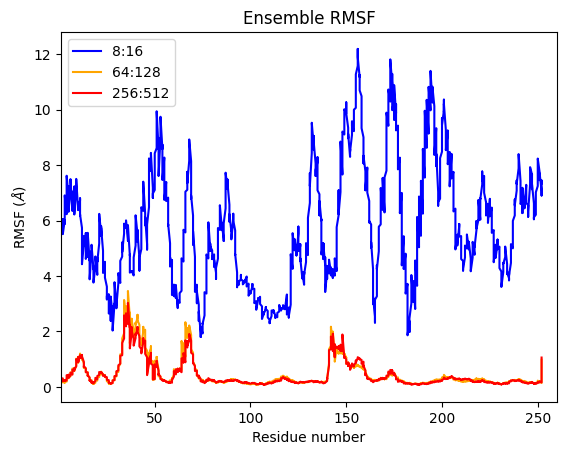

In [ ]:
#@title **Plot RMSFs**



reorder = False # @param {type:"boolean"}
new_first_index = "10" #@param {type:"string"}

if reorder:
  for resid in c_alphas.resids:
    resid = c_alphas.resids + int(new_first_index)
else:
    resid = c_alphas.resids

first_residue = 1 #@param {type:"string"}
last_residue = "260" #@param {type:"string"}

fig, ax = plt.subplots()
colors = ['blue', 'orange', 'red', 'green', 'purple', 'brown', 'magenta']
for max_seq_v, extra_seq_v, color_v, rmsf_v in zip(max_seq, extra_seq, colors, rmsf_results):
  # Plotting on the passed axes object
  ax.plot(resid, rmsf_v.results.rmsf, color=color_v, label=f'{max_seq_v[:]}:{extra_seq_v[:]}')
  ax.set_xlabel('Residue number')
  ax.set_ylabel('RMSF ($\AA$)')
  ax.set_title('Ensemble RMSF')
  ax.set_xlim(int(first_residue), int(last_residue))
  ax.legend()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

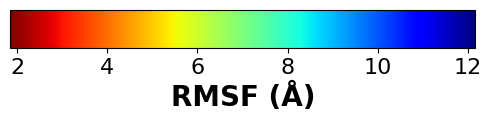

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

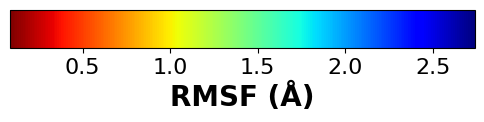

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

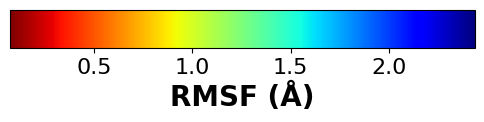

In [ ]:
#@title **Save the RMSF values as custom B factors and display the 3D structure**

import matplotlib.pyplot as plt
from MDAnalysis.analysis import rms, align
import os
import glob
import re
import MDAnalysis as mda
from MDAnalysis.analysis import pca, align
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.cm as cm
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
import py3Dmol
import glob
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")

class loadPredictions:
    def __init__(self, trajectory_files, topology_file):
        """
        Initialize the LoadTrajectory class with a list of trajectory files and a single topology file.

        :param trajectory_files: List of paths to trajectory files (.pdb)
        :param topology_file: Path to the topology file (.pdb)
        """
        self.trajectory_files = trajectory_files
        self.topology_file = topology_file
        self.universe = None

    def load(self):
        """
        Load the trajectories and the topology file into an MDAnalysis Universe.
        """
        try:
            self.universe = mda.Universe(self.topology_file, self.trajectory_files, dt=1)
        except Exception as e:
            print(f"An error occurred while loading the files: {e}")

    def get_universe(self):
        """
        Return the MDAnalysis Universe object.
        """
        if self.universe is not None:
            return self.universe
        else:
            print("Universe not loaded. Call the 'load' method first.")
            return None


def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    """
    Helper function for natural sorting (human sorting).
    """
    return [atoi(c) for c in re.split(r'(\d+)', text)]

def sorted_natural_glob(pattern, sort=False):
    """
    Perform a glob search and return a list of file paths.
    Sort the list naturally by file name if sort is True.

    :param pattern: Glob pattern to search for.
    :param sort: Boolean indicating whether to sort the results.
    :return: List of file paths, sorted if sort is True.
    """
    file_paths = glob.glob(pattern)
    if sort:
        file_paths.sort(key=lambda x: natural_keys(x))
    return file_paths


def pdbRMSF(base_path, analysis_range, max_seq_v, extra_seq_v, pdb_rmsf, sort=True):
    pdb_files = sorted_natural_glob(base_path+'/*.pdb', sort)
    topology_file = pdb_files[0]

    u_getter = loadPredictions(pdb_files, topology_file)
    u_getter.load()
    u = u_getter.get_universe()

    average = align.AverageStructure(u, u, select=analysis_range, ref_frame=0).run()
    ref = average.results.universe
    aligner = align.AlignTraj(u, ref, select=analysis_range, in_memory=True).run()
    c_alphas = u.select_atoms(analysis_range)
    R = rms.RMSF(c_alphas).run()
    rmsf_data = pd.DataFrame(R.rmsf,index=c_alphas.resnums,columns=['RMSF']) #Saving the RMSF value for every aC residue
    rmsf_3d=[]
    protein_write = u.select_atoms("protein")
    protein_write.write("protein_bfactor.pdb")
    u1=mda.Universe("protein_bfactor.pdb","protein_bfactor.pdb")
    u1.add_TopologyAttr('tempfactors') #Initialization of B factors (tempfactors) by MDA in the Universe atoms
    for atom in u1.atoms:
        rmsf_3d.append(rmsf_data.loc[atom.resid,'RMSF']) #A new list of RMSF must be created by ATOM. Our table has this values per aC. We can create a longer list easily
    with mda.Writer(pdb_rmsf, u1) as PDB: #This is the functionality from MDA which allos us to save PDB files.
        for ts in u1.trajectory: #I'll save just the first frame in PDB as snapshot
            u1.atoms.tempfactors = rmsf_3d #This adds the custom B factors to the PDB snapshot
            PDB.write(u1.atoms)
    return R, c_alphas


def show_pdb(pdb_rmsf, R, analysis_range, color="RMSF"):
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_rmsf,'r').read(),'pdb')
  u=mda.Universe(pdb_rmsf,pdb_rmsf)
  c_alphas = u.select_atoms(analysis_range)
  rmsf_data = pd.DataFrame(R.rmsf,index=c_alphas.resnums,columns=['RMSF']) #Saving the RMSF value for every aC residue

  if color == "RMSF":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':min(rmsf_data['RMSF']),'max':max(rmsf_data['RMSF'])}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),list("ABCDEFGH"),
                     ["lime","cyan","magenta","yellow","salmon","white","blue","orange"]):
      view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  view.zoomTo()
  return view

def bar_color(pdb_rmsf, R, analysis_range):
  u=mda.Universe(pdb_rmsf,pdb_rmsf)
  c_alphas = u.select_atoms(analysis_range)
  rmsf_data = pd.DataFrame(R.rmsf,index=c_alphas.resnums,columns=['RMSF'])
  fig, ax = plt.subplots(figsize=(6, 1))
  fig.subplots_adjust(bottom=0.5)

  cmap = mpl.cm.jet_r
  norm = mpl.colors.Normalize(vmin=min(rmsf_data['RMSF']), vmax=max(rmsf_data['RMSF']))

  cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,norm=norm,orientation='horizontal')
  cb1.set_label('RMSF (Å)',fontsize=20,fontweight='bold')
  cb1.ax.tick_params(labelsize=16)
  plt.show()
  return fig

rmsf_sel = "name CA"

for max_seq_v, extra_seq_v in zip(max_seq, extra_seq):
    R, c_alphas = pdbRMSF(f'{jobname}_preds_{max_seq_v}_{extra_seq_v}/', rmsf_sel, max_seq_v, extra_seq_v, f'{jobname}_rmsf_{max_seq_v}_{extra_seq_v}.pdb')
    show_pdb(f'{jobname}_rmsf_{max_seq_v}_{extra_seq_v}.pdb', R, rmsf_sel, color="RMSF").show()
    bar_color(f'{jobname}_rmsf_{max_seq_v}_{extra_seq_v}.pdb', R, rmsf_sel).show()

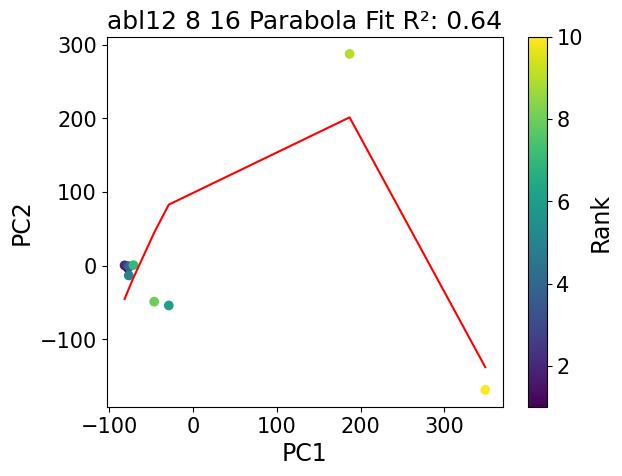

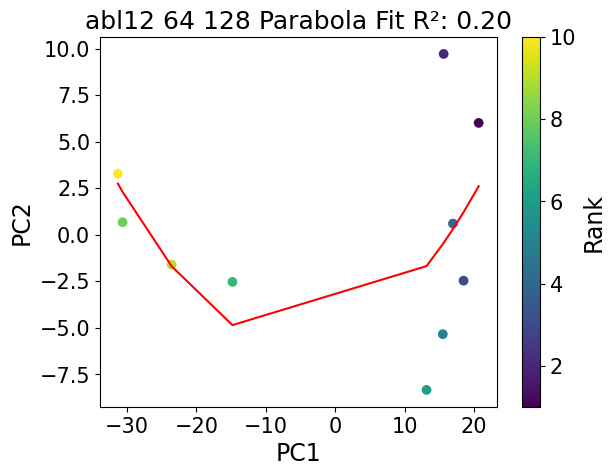

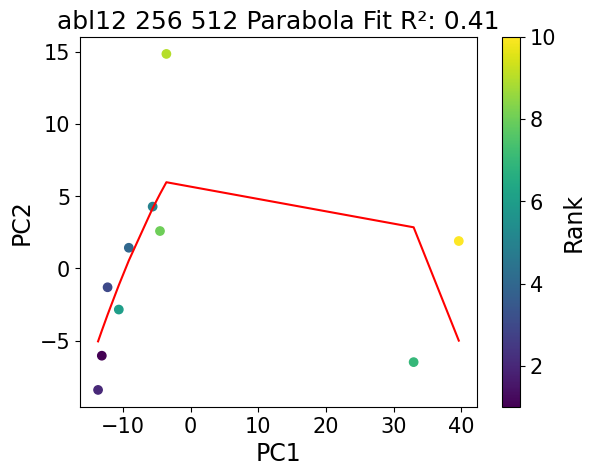

In [ ]:
#Pablo: allow users to submit their own selection logic, right now only backbone

align_sel = 'backbone'
rmsd_sel = 'backbone'

def parabola(x, a, b, c):
    return a * x**2 + b * x + c

def pca_from_ensemble(path,
                      align_range,
                      analysis_range,
                      max_seq_v,
                      extra_seq_v,
                      plot=True,
                      sort=True):

    pdb_files = sorted_natural_glob(path + '/*.pdb', sort)
    topology_file = pdb_files[0]

    u_getter = loadPredictions(pdb_files, topology_file)
    u_getter.load()
    u = u_getter.get_universe()

    aligner = align.AlignTraj(u, u, select=align_range,
                              in_memory=True).run()

    ensemble_pca = pca.PCA(u, select=analysis_range,
                           align=False, mean=None,
                           n_components=None).run()

    atomsel = u.select_atoms(analysis_range)

    # Transform and select only the first two components
    transformed_pca = ensemble_pca.transform(atomsel, n_components=3)
    pca_df = pd.DataFrame(transformed_pca, columns=['PC1', 'PC2', 'PC3'])
    popt, pcov = curve_fit(parabola, pca_df['PC1'], pca_df['PC2'])
    pca_df['PC2_fit'] = parabola(pca_df['PC1'], *popt)
    r2 = r2_score(pca_df['PC2'], pca_df['PC2_fit'])
    pca_df['Rank'] = range(1, len(pca_df) + 1)
    pca_df.sort_values('PC1', inplace=True)

    if plot:
      # Define the colormap
      cmap = cm.get_cmap('viridis')

      # Create a scatter plot with colors based on 'Rank'
      scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Rank'], cmap=cmap)

      # Adding the parabola fit line
      plt.plot(pca_df['PC1'], pca_df['PC2_fit'], color='red')

      # Adding the title and adjusting font size
      plt.title(f"{jobname} {max_seq_v} {extra_seq_v} Parabola Fit R²: {r2:.2f}", fontsize=18)

      # Setting the tick parameters
      plt.tick_params(axis='both', which='major', labelsize=15)

      # Setting the labels and their font sizes
      plt.xlabel('PC1', fontsize=17)
      plt.ylabel('PC2', fontsize=17)

      # Adding a color bar
      cbar = plt.colorbar(scatter)
      cbar.set_label('Rank', fontsize=17)
      cbar.ax.tick_params(labelsize=15)

      # Show the plot
      plt.show()

    return pca_df

pca_dfs = []
for max_seq_v, extra_seq_v in zip(max_seq, extra_seq):
  pred_df = pca_from_ensemble(f'{jobname}_preds_{max_seq_v}_{extra_seq_v}/', align_sel, rmsd_sel, max_seq_v, extra_seq_v)
  pca_dfs.append(pred_df)

In [ ]:
import py3Dmol
import warnings
align_sel = 'backbone'
rmsd_sel = 'backbone'

def load_frames(file_list):
    """ Load frames from a list of files """
    universes = [mda.Universe(f) for f in file_list]
    return universes

def save_reordered_trajectory(ordered_file_list, output_file):
    """ Save the reordered frames as a new trajectory """
    with mda.Writer(output_file, n_atoms=universes[0].atoms.n_atoms) as W:
        for pdb in ordered_file_list:
            u = mda.Universe(pdb)
            W.write(u.atoms)


def order_frames_by_pca(dir_path, align_range, analysis_range, sort=True):
    pcas = {}
    n_clusters = 2

    pdb_files = sorted_natural_glob(dir_path + '/*.pdb', sort)
    topology_file = pdb_files[0]

    u_getter = loadPredictions(pdb_files, topology_file)
    u_getter.load()
    u = u_getter.get_universe()

    aligner = align.AlignTraj(u, u, select=align_range,
                              in_memory=True).run()

    pc = pca.PCA(u, select=analysis_range,
                align=False, mean=None,
                n_components=None).run()

    backbone = u.select_atoms(analysis_range)

    # Transform and select only the first two components
    transformed = pc.transform(backbone, n_components=3)
    order = np.argsort(transformed[:, 0])
    file_list = glob.glob(dir_path + '/*.pdb')
    ordered_file_list = [file_list[i] for i in order]
    topology_file = pdb_files[0]

    u_getter = loadPredictions(ordered_file_list, topology_file)
    u_getter.load()
    u = u_getter.get_universe()
    ag = u.select_atoms('backbone')
    aligner = align.AlignTraj(u, u, select=align_range,
                              in_memory=True).run()
    ag.write(f"{jobname}_traj.pdb", frames='all')
    return u

for max_seq_v, extra_seq_v in zip(max_seq, extra_seq):
  u = order_frames_by_pca(f'{jobname}_preds_{max_seq_v}_{extra_seq_v}/', align_sel, rmsd_sel)

  warnings.filterwarnings('ignore')

  #py3dmol functions
  class Atom(dict):
    def __init__(self, line):
      self["type"] = line[0:6].strip()
      self["idx"] = line[6:11].strip()
      self["name"] = line[12:16].strip()
      self["resname"] = line[17:20].strip()
      self["resid"] = int(int(line[22:26]))
      self["x"] = float(line[30:38])
      self["y"] = float(line[38:46])
      self["z"] = float(line[46:54])
      self["sym"] = line[76:78].strip()

    def __str__(self):
      line = list(" " * 80)
      line[0:6] = self["type"].ljust(6)
      line[6:11] = self["idx"].ljust(5)
      line[12:16] = self["name"].ljust(4)
      line[17:20] = self["resname"].ljust(3)
      line[22:26] = str(self["resid"]).ljust(4)
      line[30:38] = str(self["x"]).rjust(8)
      line[38:46] = str(self["y"]).rjust(8)
      line[46:54] = str(self["z"]).rjust(8)
      line[76:78] = self["sym"].rjust(2)
      return "".join(line) + "\n"

  class Molecule(list):
    def __init__(self, file):
      for line in file:
        if "ATOM" in line or "HETATM" in line:
          self.append(Atom(line))

      def __str__(self):
        outstr = ""
        for at in self:
          outstr += str(at)
        return outstr


  stride_animation = 1

  # Write out frames for animation
  protein = u.select_atoms('not (resname WAT)')
  i = 0
  for ts in u.trajectory[0:len(u.trajectory):int(stride_animation)]:
      if i > -1:
          with mda.Writer('' + str(i) + '.pdb', protein.n_atoms) as W:
              W.write(protein)
      i = i + 1
  # Load frames as molecules
  molecules = []
  for i in range(int(len(u.trajectory)/int(stride_animation))):
      with open('' + str(i) + '.pdb') as ifile:
          molecules.append(Molecule(ifile))

  models = ""
  for i in range(len(molecules)):
    models += "MODEL " + str(i) + "\n"
    for j,mol in enumerate(molecules[i]):
      models += str(mol)
    models += "ENDMDL\n"
  #view.addModelsAsFrames(models)

  # Animation
  view = py3Dmol.view(width=800, height=600)
  view.addModelsAsFrames(models)
  for i, at in enumerate(molecules[0]):
      default = {"cartoon": {'color': 'spectrum'}}
      view.setStyle({'model': -1, 'serial': i+1}, at.get("pymol", default))

  view.zoomTo()
  view.animate({'loop': "forward"})
  view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
#@title **Download your results**
from google.colab import files
import locale
import subprocess

def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

if os.path.exists("results_AF2.zip"):
  os.remove("results_AF2.zip")
else:
  pass

subprocess.run("zip -FSr results_AF2.zip *", shell=True)
files.download('results_AF2.zip')